># <font color = blue> <U>Lending Club Case Study - Submission by Mythili and Satya</U> </font>

## Problem Statement 

### Introduction
Solving this assignment will give you an idea about how real business problems are solved using EDA. In this case study, apart from applying the techniques you have learnt in EDA, you will also develop a basic understanding of risk analytics in banking and financial services and understand how data is used to minimise the risk of losing money while lending to customers.
  
### Business Understanding
You work for a consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:
- If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company
- If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company
 
The data given below contains information about past loan applicants and whether they ‘defaulted’ or not. The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc.
 
In this case study, you will use EDA to understand how consumer attributes and loan attributes influence the tendency of default.

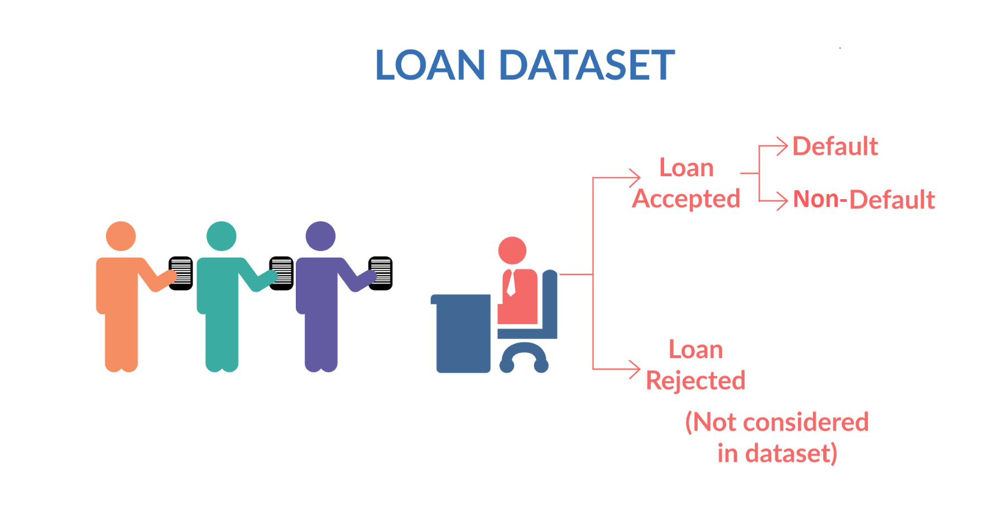
 
When a person applies for a loan, there are two types of decisions that could be taken by the company:
1. <B>Loan accepted:</B> If the company approves the loan, there are 3 possible scenarios described below:
>- <B>Fully paid:</B> Applicant has fully paid the loan (the principal and the interest rate)
>- <B>Current:</B> Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.
>- <B>Charged-off:</B> Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 
2. <B>Loan rejected:</B> The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)
 
### Business Objectives
This company is the largest online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures. Borrowers can easily access lower interest rate loans through a fast online interface. 
 
Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). Credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. 
 
If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.
 
In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment. 

To develop your understanding of the domain, you are advised to independently research a little about risk analytics (understanding the types of variables and their significance should be enough).
 
### Data Understanding
 
Download the dataset from the upgrad course module. It contains the complete loan data for all loans issued through the time period 2007 t0 2011.

You can access the data dictionary which describes the meaning of these variables from the provided link in upgrad course module.
 
### Results Expected
1. Write all your code in one well-commented Python file; briefly mention the insights and observations from the analysis 
2. Present the overall approach of the analysis in a presentation: 
>- Mention the problem statement and the analysis approach briefly 
>- Explain the results of univariate, bivariate analysis etc. in business terms
>- Include visualisations and summarise the most important results in the presentation
 
You need to submit one Ipython notebook which clearly explains the thought process behind your analysis (either in comments of markdown text), code and relevant plots. 
 
<B>Important Note</B>: Please make sure to rename your Python notebook "Group_Facilitator_Name.ipynb". 
 
You need to submit a GitHub repository link that contains the files above . You need to write a README.md for the GitHub repository.  You can follow the video in the module to understand how to create the GitHub repository. Make sure your GitHub link is public. 



### Import Necessary Libraries

In [346]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

import warnings
warnings.filterwarnings('ignore') #Ignore warnings

### Read data from loan file in dataframe

In [347]:
df = pd.read_csv('loan.csv') 

In [348]:
df.shape #Display shape of the data frame

(39717, 111)

In [349]:
pd.set_option('display.max_columns', None) #set dataframe to show all columns
df.head(5) #display top 5 rows from the dataframe

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [350]:
df.info(verbose=True, show_counts=True) #Display dataframe information for all columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

### Observations
- Total numbers of rows are 39717.
- Total numbers of columns are 111.
- Data type of some columns i.e. term, int_rate are object. These should be converted to int, float by removing non numeric characters from the value.
- Many columns i.e. emp_length, emp_length, desc etc have missing values. These needs to be imputed or dropped based on case to case basis.
- Many columns i.e. mths_since_last_major_derog, annual_inc_joint, dti_joint etc. have only null values. These columns can be dropped.
- Distribution of columns based on datatypes are: float64(74), int64(13), object(24)

## Data Cleaning

### Check and drop columns having only null values

In [351]:
df.isnull().all().sum() # Count the number of columns having only null values

54

In [352]:
df = df.dropna(axis=1, how='all') # Drop all the columns having only null values

In [353]:
df.shape #Display shape of the dataframe after dropping null columns, it should be 57(111-54)

(39717, 57)

### Check missing values in remaining columns

In [354]:
(df.isnull().mean()*100).round(2)   #Display percentage of missing values for each column unpto two decimal points

id                             0.00
member_id                      0.00
loan_amnt                      0.00
funded_amnt                    0.00
funded_amnt_inv                0.00
term                           0.00
int_rate                       0.00
installment                    0.00
grade                          0.00
sub_grade                      0.00
emp_title                      6.19
emp_length                     2.71
home_ownership                 0.00
annual_inc                     0.00
verification_status            0.00
issue_d                        0.00
loan_status                    0.00
pymnt_plan                     0.00
url                            0.00
desc                          32.59
purpose                        0.00
title                          0.03
zip_code                       0.00
addr_state                     0.00
dti                            0.00
delinq_2yrs                    0.00
earliest_cr_line               0.00
inq_last_6mths              

In [355]:
null_perc = (df.isnull().mean()*100).round(2) #Store null %age of all columns
null_perc[null_perc >0].sort_values(ascending=False) #Display only the columns with null values in descending order

next_pymnt_d                  97.13
mths_since_last_record        92.99
mths_since_last_delinq        64.66
desc                          32.59
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
dtype: float64

### Drop/Impute columns having too many missing values - more than 40 to 50%
#### As a rule of thumb we should not consider any columns with more than 40 to 50% missing values. But lets look at case to case basis for columns matching this criteria.
1. next_pymnt_d(97% missing values) - Next scheduled payment date:- 
- Since this column as 97% missing records and we does not need it for our analysis, we can drop it
2. mths_since_last_record(93% missing values) - The number of months since the last public record:-
- As per the definition of this field, it is expected that not all rows will have data. This column can be meaningful during out analysis so lets keep it and replace all null values with zero.
3. mths_since_last_delinq(65% missing values) - The number of months since the borrower's last delinquency:-
- As per the definition of this field, it is expected that not all rows will have data. This column can be meaningful during out analysis so lets keep it and replace all null values with zero.

In [356]:
df=df.drop("next_pymnt_d",axis=1)

In [357]:
df["mths_since_last_record"]=df["mths_since_last_record"].fillna(0) #impute mths_since_last_record with zero for missing  values
df["mths_since_last_delinq"]=df["mths_since_last_delinq"].fillna(0) #impute mths_since_last_delinq with zero for missing  values

In [358]:
null_perc = (df.isnull().mean()*100).round(2) #Store null %age of all columns
null_perc[null_perc >0].sort_values(ascending=False) #Display only the columns with null values in descending order

desc                          32.59
emp_title                      6.19
emp_length                     2.71
pub_rec_bankruptcies           1.75
last_pymnt_d                   0.18
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
revol_util                     0.13
tax_liens                      0.10
title                          0.03
last_credit_pull_d             0.01
dtype: float64

### Drop/Impute other columns with missing values

In [359]:
df.head(5)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,0.0,0.0,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,0.0,0.0,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,0.0,0.0,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,0.0,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0,Jan-96,0,38.0,0.0,15,0,27783,53.90%,38,f,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


#### desc - Loan description provided by the borrower

In [360]:
#Desc does not seem relevant for our analysis and has 33% missing value. So lets drop it
df=df.drop("desc",axis=1)

#### emp_title - The job title supplied by the Borrower when applying for the loan.(Employer Title replaces Employer Name for all loans listed after 9/23/2013)

In [361]:
#emp_title does not seem relevant for our analysis and has 6% missing value. So lets drop it
df=df.drop("emp_title",axis=1)

#### emp_length - Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

In [362]:
#emp_length seems relevant for our analysis. So, lets look at the rows with missing values
df[df["emp_length"].isnull()]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
168,1067644,1302032,2500,2500,2500.00000,36 months,7.51%,77.78,A,A3,NaN,OWN,12000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,GET FREE OF DEBT,961xx,CA,16.30,0,Aug-94,2,0.0,0.0,13,0,4853,42.20%,20,f,0.0,0.0,1838.880000,1838.88,1575.06,253.74,0.00,10.08,0.0000,Dec-13,77.78,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
323,1058717,1290516,18000,18000,18000.00000,60 months,17.58%,452.98,D,D4,NaN,MORTGAGE,60000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,consolidation,363xx,AL,21.96,0,Mar-03,1,75.0,0.0,11,0,5945,83.70%,28,f,0.0,0.0,26378.550010,26378.55,18000.00,8378.55,0.00,0.00,0.0000,Sep-15,6909.59,Sep-15,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
394,1064582,1298394,4000,4000,4000.00000,36 months,11.71%,132.31,B,B3,NaN,RENT,24000.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Reline pool and fix steeps,328xx,FL,7.50,1,Feb-05,0,16.0,0.0,4,0,1593,54.90%,6,f,0.0,0.0,4186.023030,4186.02,4000.00,186.02,0.00,0.00,0.0000,May-12,3658.15,May-12,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
422,1064366,1298164,1000,1000,1000.00000,36 months,14.65%,34.50,C,C3,NaN,RENT,18408.0,Not Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,major_purchase,Myloan,080xx,NJ,6.00,0,Apr-93,2,0.0,114.0,3,1,2510,83.70%,8,f,0.0,0.0,91.310000,91.31,22.24,12.18,0.00,56.89,10.2402,Jan-12,34.50,Jun-12,0.0,1,INDIVIDUAL,0,0.0,0,1.0,0.0
439,1063912,1296491,8250,8250,8250.00000,36 months,7.51%,256.67,A,A3,NaN,MORTGAGE,31500.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,do over,218xx,MD,17.87,0,Dec-81,4,0.0,0.0,17,0,7521,10.40%,37,f,0.0,0.0,9239.889998,9239.89,8250.00,989.89,0.00,0.00,0.0000,Dec-14,278.92,Dec-14,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32591,480410,610728,10000,10000,9975.00000,36 months,14.22%,342.85,C,C5,NaN,RENT,45000.0,Not Verified,Jan-10,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,small_business,Expanding Salon Business,191xx,PA,4.51,0,Sep-00,0,37.0,0.0,9,0,9696,66.40%,17,f,0.0,0.0,10457.944160,10431.80,10000.00,457.94,0.00,0.00,0.0000,Jun-10,9431.97,Jul-10,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
32608,480216,610335,3700,3700,3700.00000,36 months,14.22%,126.86,C,C5,NaN,RENT,17496.8,Not Verified,Jan-10,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,Financial Freedom,752xx,TX,3.36,0,Aug-06,0,0.0,0.0,2,0,1605,45.90%,5,f,0.0,0.0,4566.723907,4566.72,3700.00,866.72,0.00,0.00,0.0000,Feb-13,132.70,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
32621,479954,609955,10000,10000,9731.17513,36 months,14.22%,342.85,C,C5,NaN,MORTGAGE,36000.0,Not Verified,Jan-10,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,other,Retired & Happy,021xx,MA,3.83,2,Apr-00,3,19.0,0.0,3,0,344,34.40%,19,f,0.0,0.0,7542.370000,7431.53,5591.87,1938.07,0.00,12.43,4.3000,Dec-11,342.85,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
32631,479836,609803,6000,6000,6000.00000,36 months,12.73%,201.40,C,C1,NaN,MORTGAGE,60000.0,Not

Number of rows with missing values is 1075 out of 39717, which is 2.7%. Looking the data it does not appear that we can somehow derive this data from other columns so lets drop the rows with missing values

In [363]:
df = df[df["emp_length"].notna()] #overwrite dataframe with valid rows 

In [364]:
df.shape #number of remaing rows should be 38642(39717-1075)

(38642, 54)

#### pub_rec_bankruptcies - Number of public record bankruptcies

In [365]:
#pub_rec_bankruptcies seems relevant for our analysis. So, lets look at the rows with missing values
df[df["pub_rec_bankruptcies"].isnull()]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
35006,69001,265533,15000,15000,14875.000000,36 months,8.94%,476.58,A,A5,< 1 year,MORTGAGE,110000.0,Not Verified,Sep-09,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Revolving Debt,146xx,NY,7.07,0,Nov-91,1,0.0,0.0,6,0,7586,52.70%,19,f,0.0,0.0,17135.510230,16992.71,15000.00,2135.51,0.0,0.0,0.0,Jul-12,1919.13,Aug-15,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
35058,59006,154254,3000,3000,2988.236621,36 months,14.26%,102.92,C,C5,3 years,MORTGAGE,80800.0,Not Verified,Sep-09,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Rejecting new cardmember agreement,775xx,TX,14.97,1,Jul-98,0,13.0,0.0,13,0,4740,39.50%,23,f,0.0,0.0,3704.997650,3688.85,3000.00,705.00,0.0,0.0,0.0,Oct-12,111.23,Sep-12,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
35362,65426,232106,4000,4000,3892.258856,36 months,11.14%,131.22,B,B1,< 1 year,MORTGAGE,60000.0,Not Verified,Aug-09,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,car,djp,481xx,MI,11.08,0,Aug-95,0,0.0,0.0,14,0,24220,68.60%,33,f,0.0,0.0,2755.200000,2615.80,2170.35,584.85,0.0,0.0,0.0,Jun-11,131.22,May-16,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
38443,68926,264924,2300,2300,589.605658,36 months,13.17%,77.69,D,D2,10+ years,RENT,37152.0,Verified,Aug-08,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,moving,tee_cee,088xx,NJ,2.26,0,Dec-97,0,46.0,0.0,4,0,2211,88.40%,13,f,0.0,0.0,2796.601136,643.50,2300.00,496.60,0.0,0.0,0.0,Sep-11,77.78,May-16,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
38717,69251,267771,6000,6000,500.000000,36 months,8.00%,188.02,A,A3,< 1 year,MORTGAGE,75000.0,Not Verified,May-08,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,NewOrganic,441xx,OH,16.08,0,Dec-94,1,0.0,0.0,16,0,29797,23.20%,39,f,0.0,0.0,6783.750468,565.31,5999.99,768.76,15.0,0.0,0.0,May-11,189.36,May-11,0.0,1,INDIVIDUAL,0,0.0,0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.000000,36 months,8.07%,78.42,A,A4,4 years,MORTGAGE,110000.0,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home Improvement,802xx,CO,11.33,0,Nov-90,0,0.0,0.0,13,0,7274,13.10%,40,f,0.0,0.0,2822.969293,1213.88,2500.00,322.97,0.0,0.0,0.0,Jul-10,80.90,Jun-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39713,90665,90607,8500,8500,875.000000,36 months,10.28%,275.38,C,C1,3 years,RENT,18000.0,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Retiring credit card debt,274xx,NC,6.40,1,Dec-86,1,5.0,0.0,6,0,8847,26.90%,9,f,0.0,0.0,9913.491822,1020.51,8500.00,1413.49,0.0,0.0,0.0,Jul-10,281.94,Jul-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39714,90395,90390,5000,5000,1325.000000,36 months,8.07%,156.84,A,A4,< 1 year,MORTGAGE,100000.0,Not Verified,Jul-07,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,MBA Loan Consolidation,017xx,MA,2.30,0,Oct-98,0,0.0,0.0,11,0,9698,19.40%,20,f,0.0,0.0,5272.161128,1397.12,5000.00,272.16,0.0,0.0,0.0,Apr-08,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39715,90376,89243,5000,5000,650.000000,36 months,7.43%,155.38,A,A2,< 1 year,MORTGAGE,200000.0,Not Verified,Jul-07,Ful

In [366]:
null_perc = (df.isnull().mean()*100).round(2) #Store null %age of all columns
null_perc[null_perc >0].sort_values(ascending=False) #Display only the columns with null values in descending order

pub_rec_bankruptcies          1.80
last_pymnt_d                  0.17
collections_12_mths_ex_med    0.14
chargeoff_within_12_mths      0.14
revol_util                    0.12
tax_liens                     0.10
title                         0.03
last_credit_pull_d            0.01
dtype: float64

In [367]:
df["pub_rec_bankruptcies"].value_counts()

pub_rec_bankruptcies
0.0    36375
1.0     1563
2.0        7
Name: count, dtype: int64

We can see that almost 95% of the rows have value as zero, so we can safely fill the null values with zero

In [368]:
df['pub_rec_bankruptcies'].mode()[0]

0.0

In [369]:
df["pub_rec_bankruptcies"]=df["pub_rec_bankruptcies"].fillna(df['pub_rec_bankruptcies'].mode()[0]) #impute pub_rec_bankruptcies with mode value

In [370]:
df["pub_rec_bankruptcies"].value_counts()

pub_rec_bankruptcies
0.0    37072
1.0     1563
2.0        7
Name: count, dtype: int64

#### Remaining columns with missing values are very less. We can safely drop the rows with null values
- <B>Column name -                   Percentage of null values</B>
- last_pymnt_d                  0.17
- collections_12_mths_ex_med    0.14
- chargeoff_within_12_mths      0.14
- revol_util                    0.12
- tax_liens                     0.10
- title                         0.03
- last_credit_pull_d            0.01

In [371]:
df.shape

(38642, 54)

In [372]:
df1 = df #backup data frame

In [373]:
df.isnull().any(axis=1).sum() #number of rows having any null values

177

In [374]:
df.dropna(inplace=True) #drop all the rows having null values

In [375]:
df.shape

(38465, 54)

<B>We can see that 38642-38465=177 rows got dropped. Number of columns remains same as 54, before and after</B>

In [376]:
df.isnull().sum()   #Display count of missing values for each column, all should be zeroes

id                            0
member_id                     0
loan_amnt                     0
funded_amnt                   0
funded_amnt_inv               0
term                          0
int_rate                      0
installment                   0
grade                         0
sub_grade                     0
emp_length                    0
home_ownership                0
annual_inc                    0
verification_status           0
issue_d                       0
loan_status                   0
pymnt_plan                    0
url                           0
purpose                       0
title                         0
zip_code                      0
addr_state                    0
dti                           0
delinq_2yrs                   0
earliest_cr_line              0
inq_last_6mths                0
mths_since_last_delinq        0
mths_since_last_record        0
open_acc                      0
pub_rec                       0
revol_bal                     0
revol_ut

### Check for columns having only one unique value and drop them 

In [377]:
df.nunique() #unique values in dataframe

id                            38465
member_id                     38465
loan_amnt                       879
funded_amnt                    1037
funded_amnt_inv                8084
term                              2
int_rate                        371
installment                   15082
grade                             7
sub_grade                        35
emp_length                       11
home_ownership                    5
annual_inc                     5086
verification_status               3
issue_d                          53
loan_status                       3
pymnt_plan                        1
url                           38465
purpose                          14
title                         19047
zip_code                        820
addr_state                       50
dti                            2863
delinq_2yrs                      11
earliest_cr_line                515
inq_last_6mths                    9
mths_since_last_delinq           95
mths_since_last_record      

In [378]:
columns_to_drop = df.columns[df.nunique() == 1] #column names with only 1 unique value in dataframe - 9 columns

In [379]:
df.shape

(38465, 54)

In [380]:
df = df.drop(columns=columns_to_drop,axis=1)

In [381]:
df.shape

(38465, 45)

In [382]:
#Reset the index
df.reset_index(inplace=True, drop=True)

## Fix data types of object type columns

In [383]:
df.select_dtypes(include=object).info() #display information of only the columns having datatype as object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   term                 38465 non-null  object
 1   int_rate             38465 non-null  object
 2   grade                38465 non-null  object
 3   sub_grade            38465 non-null  object
 4   emp_length           38465 non-null  object
 5   home_ownership       38465 non-null  object
 6   verification_status  38465 non-null  object
 7   issue_d              38465 non-null  object
 8   loan_status          38465 non-null  object
 9   url                  38465 non-null  object
 10  purpose              38465 non-null  object
 11  title                38465 non-null  object
 12  zip_code             38465 non-null  object
 13  addr_state           38465 non-null  object
 14  earliest_cr_line     38465 non-null  object
 15  revol_util           38465 non-null  object
 16  last

In [384]:
df.select_dtypes(include=object).head(5) #Display values of only the object data type columns

,term,int_rate,grade,sub_grade,emp_length,home_ownership,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,earliest_cr_line,revol_util,last_pymnt_d,last_credit_pull_d
0,36 months,10.65%,B,B2,10+ years,RENT,Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Computer,860xx,AZ,Jan-85,83.70%,Jan-15,May-16
1,60 months,15.27%,C,C4,< 1 year,RENT,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,car,bike,309xx,GA,Apr-99,9.40%,Apr-13,Sep-13
2,36 months,15.96%,C,C5,10+ years,RENT,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,small_business,real estate business,606xx,IL,Nov-01,98.50%,Jun-14,May-16
3,36 months,13.49%,C,C1,10+ years,RENT,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,other,personel,917xx,CA,Feb-96,21%,Jan-15,Apr-16
4,60 months,12.69%,B,B5,1 year,RENT,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loanDetail.acti...,other,Personal,972xx,OR,Jan-96,53.90%,May-16,May-16


#### Observations
- Some columns i.e. url, zip_code are not relevant for this analsys and can be dropped.
- Some columns i.e. term, int_rate, revol_util can be changed to numeric data types.
- Some columns i.e. issue_d, earliest_cr_line, last_pymnt_d, last_credit_pull_d contains date value which can be changed to date datatype.

In [385]:
df1 = df #backup dataframe as a point of restore

In [386]:
df = df.drop(columns=["url","zip_code"]) #drop columns that are not needed

In [387]:
df.term.value_counts() 

term
 36 months    28131
 60 months    10334
Name: count, dtype: int64

In [388]:
df.term = df.term.apply(lambda x: int(x[:3])) #extract numbers from term column and change to int data type

In [389]:
df.term.dtype

dtype('int64')

In [390]:
df.int_rate = df.int_rate.str.replace('%', '').astype(float) #remove % symbol from int_rate column and change data type to float

In [391]:
df.int_rate.dtype

dtype('float64')

In [392]:
df.revol_util = df.revol_util.str.replace('%', '').astype(float) #remove % symbol from revol_util column and change data type to float

In [393]:
df.revol_util.dtype

dtype('float64')

In [394]:
# Convert the Date columns:issue_d, earliest_cr_line, last_pymnt_d, last_credit_pull_d to datetime format
df['issue_d'] = pd.to_datetime(df['issue_d'], format='%b-%y')
df['earliest_cr_line'] = pd.to_datetime(df['earliest_cr_line'], format='%b-%y')
df['last_pymnt_d'] = pd.to_datetime(df['last_pymnt_d'], format='%b-%y')
df['last_credit_pull_d'] = pd.to_datetime(df['last_credit_pull_d'], format='%b-%y')

In [395]:
df.issue_d.dtype

dtype('<M8[ns]')

In [396]:
df.head(5)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,1077501,1296599,5000,5000,4975.0,36,10.65,162.87,B,B2,10+ years,RENT,24000.0,Verified,2011-12-01,Fully Paid,credit_card,Computer,AZ,27.65,0,1985-01-01,1,0.0,0.0,3,0,13648,83.7,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,2015-01-01,171.62,2016-05-01,0.0
1,1077430,1314167,2500,2500,2500.0,60,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,2011-12-01,Charged Off,car,bike,GA,1.00,0,1999-04-01,5,0.0,0.0,3,0,1687,9.4,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,2013-04-01,119.66,2013-09-01,0.0
2,1077175,1313524,2400,2400,2400.0,36,15.96,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,2011-12-01,Fully Paid,small_business,real estate business,IL,8.72,0,2001-11-01,2,0.0,0.0,2,0,2956,98.5,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,2014-06-01,649.91,2016-05-01,0.0
3,1076863,1277178,10000,10000,10000.0,36,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,2011-12-01,Fully Paid,other,personel,CA,20.00,0,1996-02-01,1,35.0,0.0,10,0,5598,21.0,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,2015-01-01,357.48,2016-04-01,0.0
4,1075358,1311748,3000,3000,3000.0,60,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,2011-12-01,Current,other,Personal,OR,17.94,0,1996-01-01,0,38.0,0.0,15,0,27783,53.9,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,2016-05-01,67.79,2016-05-01,0.0


In [397]:
df.select_dtypes(include=object).info() #display information of only the columns having datatype as object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   grade                38465 non-null  object
 1   sub_grade            38465 non-null  object
 2   emp_length           38465 non-null  object
 3   home_ownership       38465 non-null  object
 4   verification_status  38465 non-null  object
 5   loan_status          38465 non-null  object
 6   purpose              38465 non-null  object
 7   title                38465 non-null  object
 8   addr_state           38465 non-null  object
dtypes: object(9)
memory usage: 2.6+ MB


In [398]:
df.select_dtypes(include=object).head(5) #Display values of only the object data type columns

,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,title,addr_state
0,B,B2,10+ years,RENT,Verified,Fully Paid,credit_card,Computer,AZ
1,C,C4,< 1 year,RENT,Source Verified,Charged Off,car,bike,GA
2,C,C5,10+ years,RENT,Not Verified,Fully Paid,small_business,real estate business,IL
3,C,C1,10+ years,RENT,Source Verified,Fully Paid,other,personel,CA
4,B,B5,1 year,RENT,Source Verified,Current,other,Personal,OR


In [399]:
df.select_dtypes(include=object).nunique() #check count of unique values of object datatypes

grade                      7
sub_grade                 35
emp_length                11
home_ownership             5
verification_status        3
loan_status                3
purpose                   14
title                  19047
addr_state                50
dtype: int64

<B> Title is having too many unique values to make any sense out of it, so it can be dropped </B>

In [400]:
df.drop('title',axis=1,inplace=True)

### Drop outliers on Loan amount and interest rate

In [401]:
df1=df
df.shape

(38465, 42)

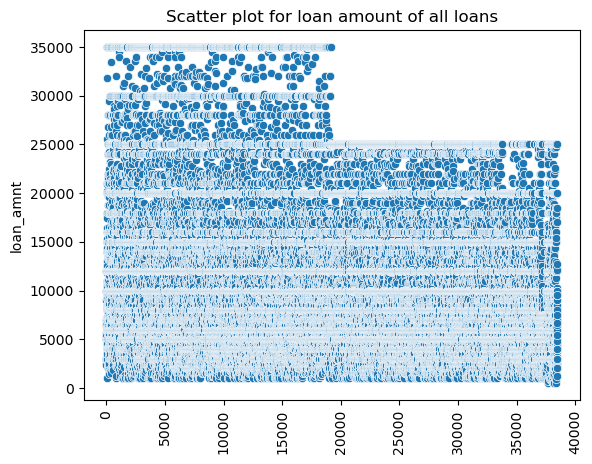

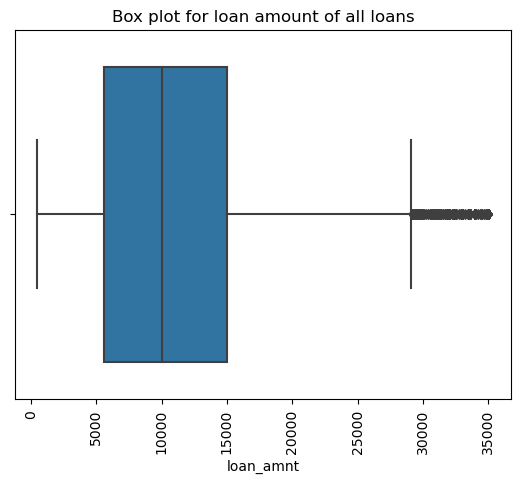

In [402]:
#Plot scatter plot and box plot for loan amount
plt.title("Scatter plot for loan amount of all loans", fontsize=12)
sns.scatterplot(df["loan_amnt"])
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for loan amount of all loans", fontsize=12)
sns.boxplot(x=df["loan_amnt"])
plt.xticks(rotation=90)
plt.show()


In [403]:
#From the above plots we can see that 100 percentile falls around 30000 and there are outliers beyond that
len(df[df["loan_amnt"] > 30000])

812

In [404]:
#drop rows with loan amount >30000

df = df[df["loan_amnt"] <= 30000]

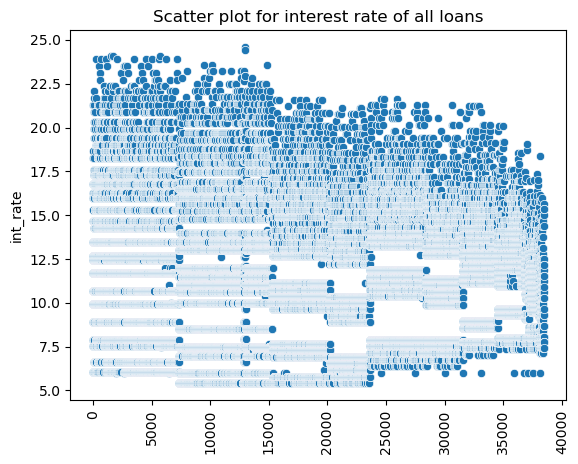

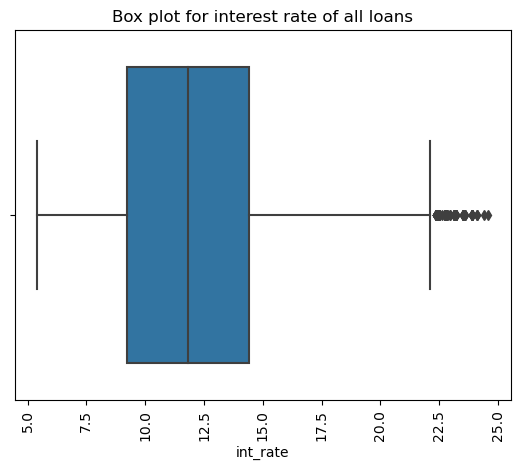

In [405]:
#Plot scatter plot and box plot for interest rate
plt.title("Scatter plot for interest rate of all loans", fontsize=12)
sns.scatterplot(df["int_rate"])
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for interest rate of all loans", fontsize=12)
sns.boxplot(x=df["int_rate"])
plt.xticks(rotation=90)
plt.show()

In [406]:
#From the above plots we can see that 100 percentile falls around 22.5 and there are outliers beyond that
len(df[df["int_rate"] > 22.5])

59

In [407]:
#drop rows with interest rate > 22.5

df = df[df["int_rate"] <= 22.5]

In [408]:
df.shape

(37594, 42)

## Categorize the variables before analysis

In [409]:
df.nunique()

id                         37594
member_id                  37594
loan_amnt                    833
funded_amnt                  951
funded_amnt_inv             7772
term                           2
int_rate                     359
installment                14668
grade                          7
sub_grade                     35
emp_length                    11
home_ownership                 5
annual_inc                  5003
verification_status            3
issue_d                       53
loan_status                    3
purpose                       14
addr_state                    50
dti                         2859
delinq_2yrs                   11
earliest_cr_line             513
inq_last_6mths                 9
mths_since_last_delinq        95
mths_since_last_record       111
open_acc                      40
pub_rec                        5
revol_bal                  20931
revol_util                  1087
total_acc                     81
out_prncp                    992
out_prncp_

In [410]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37594 entries, 0 to 38464
Data columns (total 42 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   id                       37594 non-null  int64         
 1   member_id                37594 non-null  int64         
 2   loan_amnt                37594 non-null  int64         
 3   funded_amnt              37594 non-null  int64         
 4   funded_amnt_inv          37594 non-null  float64       
 5   term                     37594 non-null  int64         
 6   int_rate                 37594 non-null  float64       
 7   installment              37594 non-null  float64       
 8   grade                    37594 non-null  object        
 9   sub_grade                37594 non-null  object        
 10  emp_length               37594 non-null  object        
 11  home_ownership           37594 non-null  object        
 12  annual_inc               37594 non-nu

In [411]:
cat_cols=["term","grade","sub_grade","emp_length","home_ownership","verification_status","loan_status","purpose","addr_state","inq_last_6mths","pub_rec","pub_rec_bankruptcies"]
num_cols=["loan_amnt","funded_amnt","int_rate","installment","annual_inc","issue_d","dti","delinq_2yrs","earliest_cr_line","mths_since_last_delinq","mths_since_last_record","open_acc","revol_util","total_acc","out_prncp","total_pymnt","total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_d","last_pymnt_amnt","last_credit_pull_d"]
extra_cols=["id","member_id","funded_amnt_inv","revol_bal","out_prncp_inv","total_pymnt_inv"]

In [412]:
df[num_cols].info() #validate that all the numeric columns have the right data types

<class 'pandas.core.frame.DataFrame'>
Index: 37594 entries, 0 to 38464
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   loan_amnt                37594 non-null  int64         
 1   funded_amnt              37594 non-null  int64         
 2   int_rate                 37594 non-null  float64       
 3   installment              37594 non-null  float64       
 4   annual_inc               37594 non-null  float64       
 5   issue_d                  37594 non-null  datetime64[ns]
 6   dti                      37594 non-null  float64       
 7   delinq_2yrs              37594 non-null  int64         
 8   earliest_cr_line         37594 non-null  datetime64[ns]
 9   mths_since_last_delinq   37594 non-null  float64       
 10  mths_since_last_record   37594 non-null  float64       
 11  open_acc                 37594 non-null  int64         
 12  revol_util               37594 non-nu

In [413]:
df1=df #backup data frame as a point of restore

In [414]:
df=df.drop(extra_cols,axis=1) #drop extra columns

In [415]:
df.shape

(37594, 36)

In [416]:
#Reset the index
df.reset_index(inplace=True, drop=True)

## Univariate Analysis

### Numerical

In [417]:
df.loan_status.value_counts()

loan_status
Fully Paid     31482
Charged Off     5118
Current          994
Name: count, dtype: int64

In [418]:
df_defaulted = df[df.loan_status == 'Charged Off'] #filter loan records for defualted loans
df_defaulted.shape

(5118, 36)

In [419]:
df_fullypaid = df[df.loan_status == 'Fully Paid'] #filter loan records for fully paid loans
df_fullypaid.shape

(31482, 36)

In [420]:
#plot histogram for all numerical columns for the loans which has defualted and fully paid for a pattern comparision
'''
for col in num_cols: 
    plt.title("Histrogram for "+col+" of defaulted loans", fontsize=12)
    sns.histplot(x=df_defaulted[col])
    plt.show()
    
    plt.title("Histrogram for "+col+" of fully paid loans", fontsize=12)
    sns.histplot(x=df_fullypaid[col])
    plt.show()
    print("===============================================================================================================")
'''

with PdfPages('Univaraite Numerical Histrogram.pdf') as pdf:
    for col in num_cols:
        # Plot for defaulted loan
        #plt.figure(figsize=(8, 6))
        plt.title("Histrogram plot for "+col+" of defaulted loans", fontsize=12)
        sns.histplot(x=df_defaulted[col])
        plt.xticks(rotation=90)
        pdf.savefig() # Save plots to a PDF file
        plt.close()

        # Plot for fully paid loan
        #plt.figure(figsize=(8, 6))
        plt.title("Histrogram plot for "+col+" of fully paid loans", fontsize=12)
        sns.histplot(x=df_fullypaid[col])
        plt.xticks(rotation=90)
        pdf.savefig() # Save plots to a PDF file
        plt.close()

    print("Boxplots saved to 'Univaraite Numerical Histrogram.pdf'")


Boxplots saved to 'Univaraite Numerical Histrogram.pdf'


### Custom univariate analsys of selected numeric columns based on observation

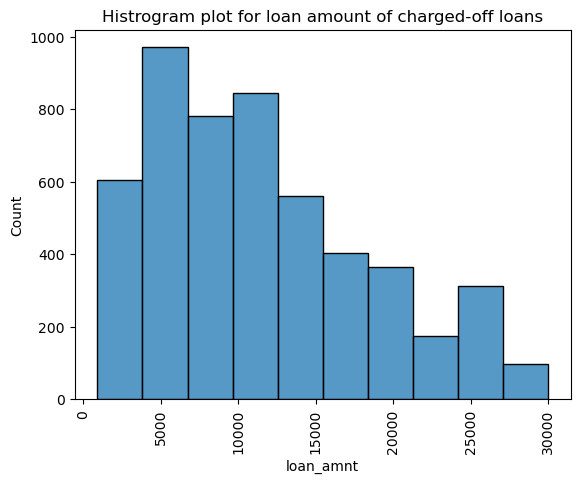

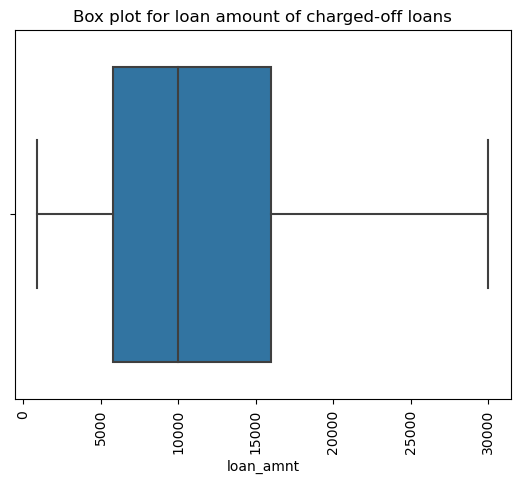

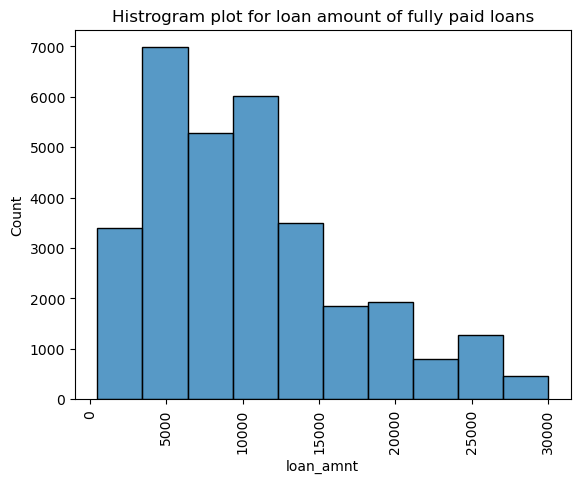

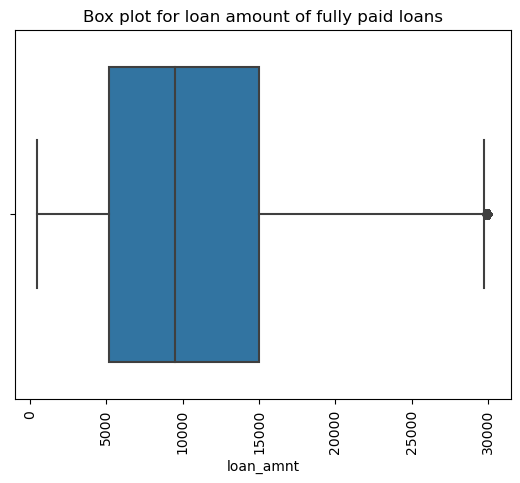

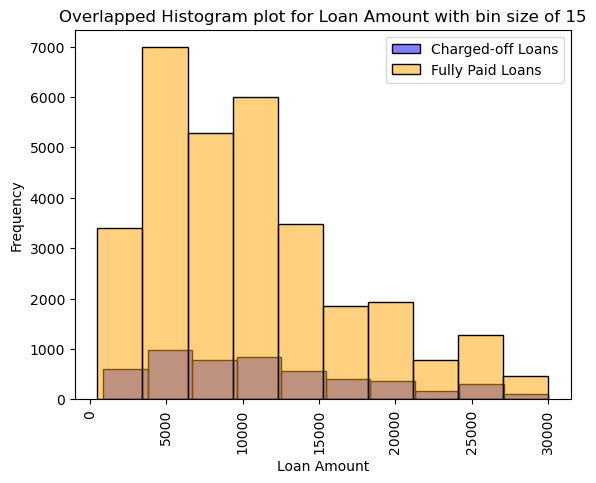

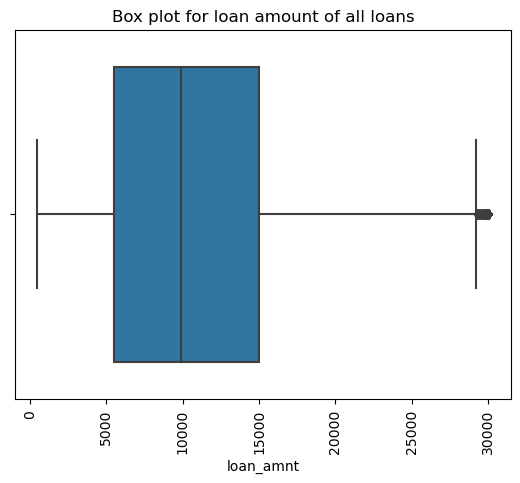

In [429]:
# Analysis of loan amount
plt.title("Histrogram plot for loan amount of charged-off loans", fontsize=12)
sns.histplot(x=df_defaulted["loan_amnt"], bins=10)
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for loan amount of charged-off loans", fontsize=12)
sns.boxplot(x=df_defaulted["loan_amnt"])
plt.xticks(rotation=90)
plt.show()

plt.title("Histrogram plot for loan amount of fully paid loans", fontsize=12)
sns.histplot(x=df_fullypaid["loan_amnt"], bins=10)
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for loan amount of fully paid loans", fontsize=12)
sns.boxplot(x=df_fullypaid["loan_amnt"])
plt.xticks(rotation=90)
plt.show()

# Use hue to distinguish between defaulted and fully paid loans
sns.histplot(data=df_defaulted, x="loan_amnt", bins=10, color='blue', alpha=0.5, label='Charged-off Loans')
sns.histplot(data=df_fullypaid, x="loan_amnt", bins=10, color='orange', alpha=0.5, label='Fully Paid Loans')

plt.title("Overlapped Histogram plot for Loan Amount with bin size of 15", fontsize=12)
plt.xlabel("Loan Amount")
plt.ylabel("Frequency")
plt.legend()
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for loan amount of all loans", fontsize=12)
sns.boxplot(x=df["loan_amnt"])
plt.xticks(rotation=90)
plt.show()


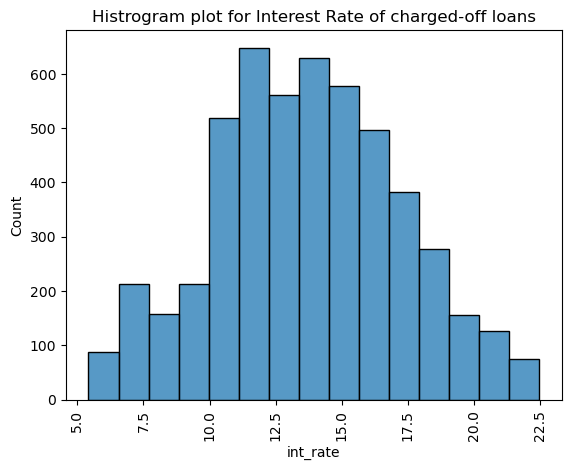

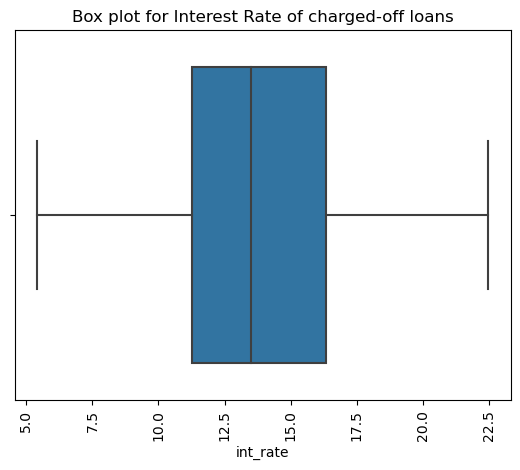

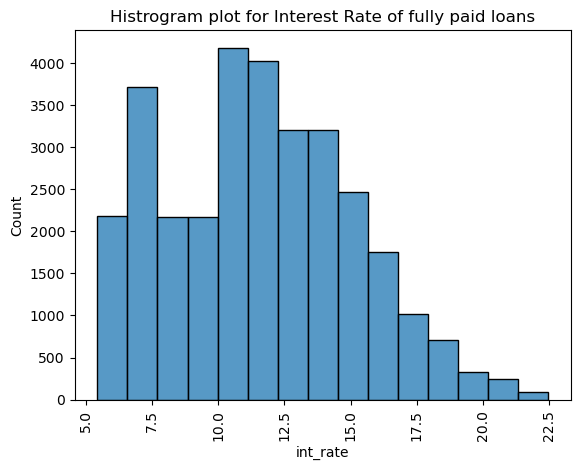

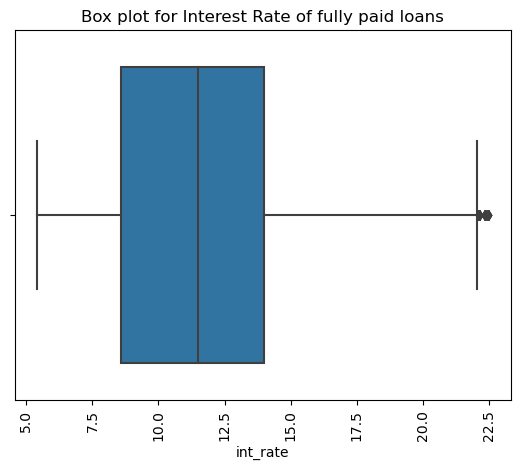

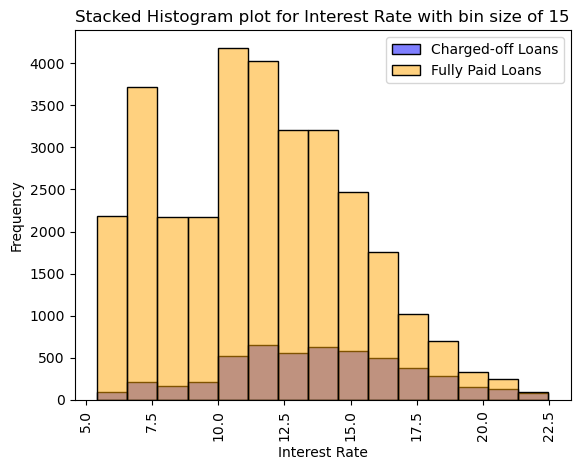

In [422]:
# Analysis of Interest Rate
plt.title("Histrogram plot for Interest Rate of charged-off loans", fontsize=12)
sns.histplot(x=df_defaulted["int_rate"], bins=15)
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for Interest Rate of charged-off loans", fontsize=12)
sns.boxplot(x=df_defaulted["int_rate"])
plt.xticks(rotation=90)
plt.show()

plt.title("Histrogram plot for Interest Rate of fully paid loans", fontsize=12)
sns.histplot(x=df_fullypaid["int_rate"], bins=15)
plt.xticks(rotation=90)
plt.show()

plt.title("Box plot for Interest Rate of fully paid loans", fontsize=12)
sns.boxplot(x=df_fullypaid["int_rate"])
plt.xticks(rotation=90)
plt.show()

# Use hue to distinguish between charged-off and fully paid loans
sns.histplot(data=df_defaulted, x="int_rate", bins=15, color='blue', alpha=0.5, label='Charged-off Loans')
sns.histplot(data=df_fullypaid, x="int_rate", bins=15, color='orange', alpha=0.5, label='Fully Paid Loans')

plt.title("Stacked Histogram plot for Interest Rate with bin size of 15", fontsize=12)
plt.xlabel("Interest Rate")
plt.ylabel("Frequency")
plt.legend()
plt.xticks(rotation=90)
plt.show()

### Categorical

In [423]:
#plot countplot for all categorical columns for the loans which has defualted and fully paid for a pattern comparision
'''
for col in cat_cols:
    plt.title("Count plot for "+col+" of defaulted loans", fontsize=12)
    sns.countplot(x=df_defaulted[col])
    plt.xticks(rotation=90)
    plt.show()

    plt.title("Count plot for "+col+" of fully paid loans", fontsize=12)
    sns.histplot(x=df_fullypaid[col])
    plt.xticks(rotation=90)
    plt.show()
    print("===============================================================================================================")
'''

with PdfPages('Univaraite Categorical countplot.pdf') as pdf:
    for col in cat_cols:
        # Plot for defaulted loan
        plt.figure(figsize=(8, 6))
        plt.title("Count plot for "+col+" of defaulted loans", fontsize=12)
        sns.countplot(x=df_defaulted[col])
        plt.xticks(rotation=90)
        pdf.savefig() # Save plots to a PDF file
        plt.close()

        # Plot for fully paid loan
        plt.figure(figsize=(8, 6))
        plt.title("Count plot for "+col+" of fully paid loans", fontsize=12)
        sns.countplot(x=df_fullypaid[col])
        plt.xticks(rotation=90)
        pdf.savefig() # Save plots to a PDF file
        plt.close()

    print("Boxplots saved to 'Univaraite Categorical countplot.pdf'")

Boxplots saved to 'Univaraite Categorical countplot.pdf'


## Bivariate Analysis

### Numerical vs Numerical

In [424]:
'''
for col1 in num_cols:
    for col2 in num_cols:
        if(col1 != col2):
            plt.title("Scatter plot for "+col+" and "+col2+" of defaulted loans", fontsize=12)
            sns.scatterplot(x=df_defaulted[col1],y=df_defaulted[col2])
            plt.show()
    print("==================================================================================================================")
'''

# Write to PDF instead of outputing here
with PdfPages('Bivariate Num vs Num Scatterplots.pdf') as pdf:
    for col1 in num_cols:
        for col2 in num_cols:
            if (col1 != col2):
                plt.figure(figsize=(8, 6))
                plt.title("Scatter plot for "+col+" and "+col2+" of defaulted loans", fontsize=12)
                sns.scatterplot(x=df_defaulted[col1], y=df_defaulted[col2])
                plt.xticks(rotation=90)
                pdf.savefig() # Save plots to a PDF file
                plt.close()
    print("Boxplots saved to 'Bivariate Num vs Num Scatterlots.pdf'")

Boxplots saved to 'Bivariate Num vs Num Scatterlots.pdf'


### Numerical Vs Categorical

In [425]:
'''
for col1 in cat_cols:
    for col2 in num_cols:
                
        if(col1 != col2) & (not pd.api.types.is_datetime64_any_dtype(df[col2])):                 #exclude date fields
            plt.title("Box plot for "+col1+" and "+col2+" of defaulted loans", fontsize=12)
            sns.boxplot(x=df_defaulted[col1],y=df_defaulted[col2])
            plt.xticks(rotation=90)
            plt.show()
    print("==================================================================================================================")
'''

# Write to PDF instead of outputing here
with PdfPages('Bivariate Num vs Cat boxplots.pdf') as pdf:
    for col1 in cat_cols:
        for col2 in num_cols:
            if (col1 != col2) and (not pd.api.types.is_datetime64_any_dtype(df_defaulted[col2])): #Do not include datetime columns
                plt.figure(figsize=(8, 6))
                plt.title("Box plot for "+col1+" and "+col2+" of defaulted loans", fontsize=12)
                sns.boxplot(x=df_defaulted[col1], y=df_defaulted[col2])
                plt.xticks(rotation=90)
                pdf.savefig() # Save plots to a PDF file
                plt.close()
    print("Boxplots saved to 'Bivariate Num vs Cat boxplots.pdf'")

Boxplots saved to 'Bivariate Num vs Cat boxplots.pdf'


### Categorical Vs Categorical

In [426]:
# Write to PDF instead of outputing here
with PdfPages('Bivariate Cat vs Cat barplots.pdf') as pdf:
    for col1 in cat_cols:
        for col2 in cat_cols:
            if (col1 != col2) and (pd.api.types.is_any_real_numeric_dtype(df_defaulted[col2])): #On the Y axis include only the columns hvaing numeric values
                plt.title("Bar plot for "+col1+" and "+col2+" of defaulted loans", fontsize=12)
                sns.barplot(x=df_defaulted[col1], y=df_defaulted[col2])
                plt.xticks(rotation=90)
                pdf.savefig() # Save plots to a PDF file
                plt.close()
    print("Boxplots saved to 'Bivariate Cat vs Cat barplots.pdf'")

Boxplots saved to 'Bivariate Cat vs Cat barplots.pdf'


## Multivariate Analysis

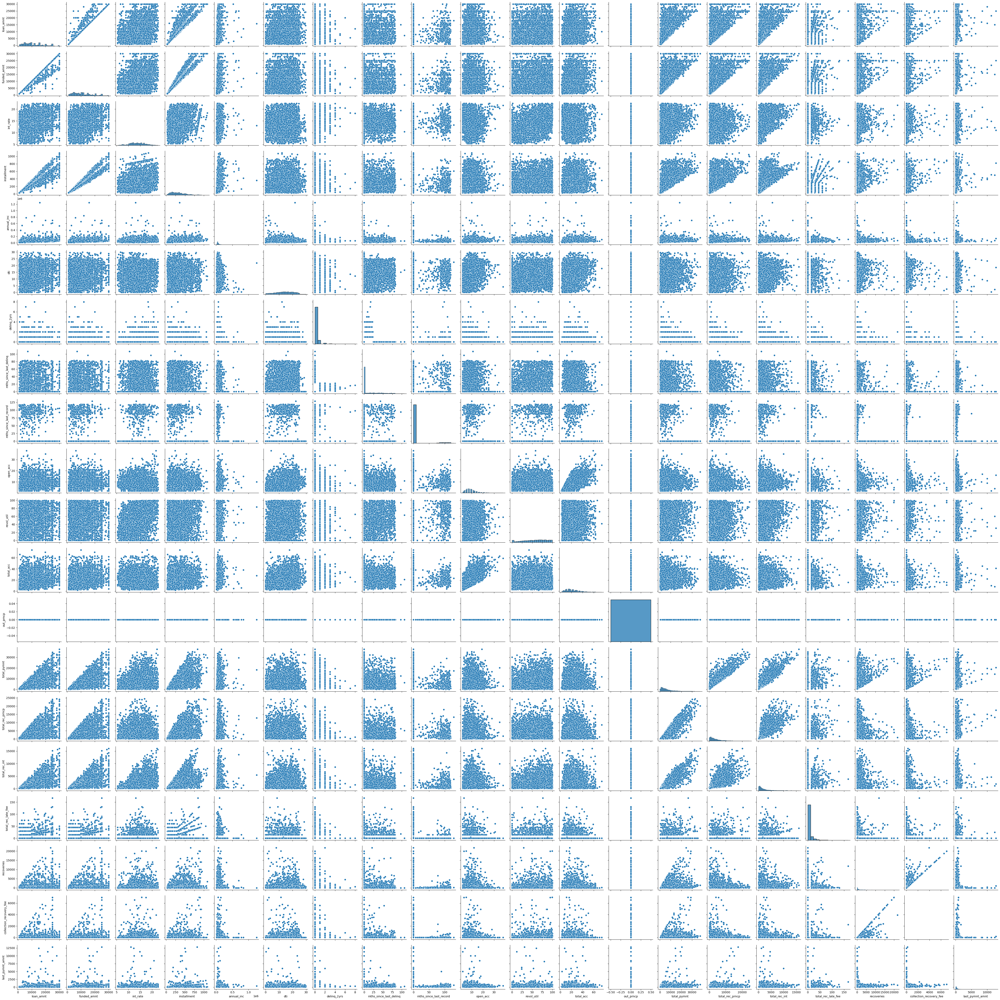

In [427]:
sns.pairplot(df_defaulted[num_cols]) #pairplot only for numerical columns of defaulted loans
plt.show()

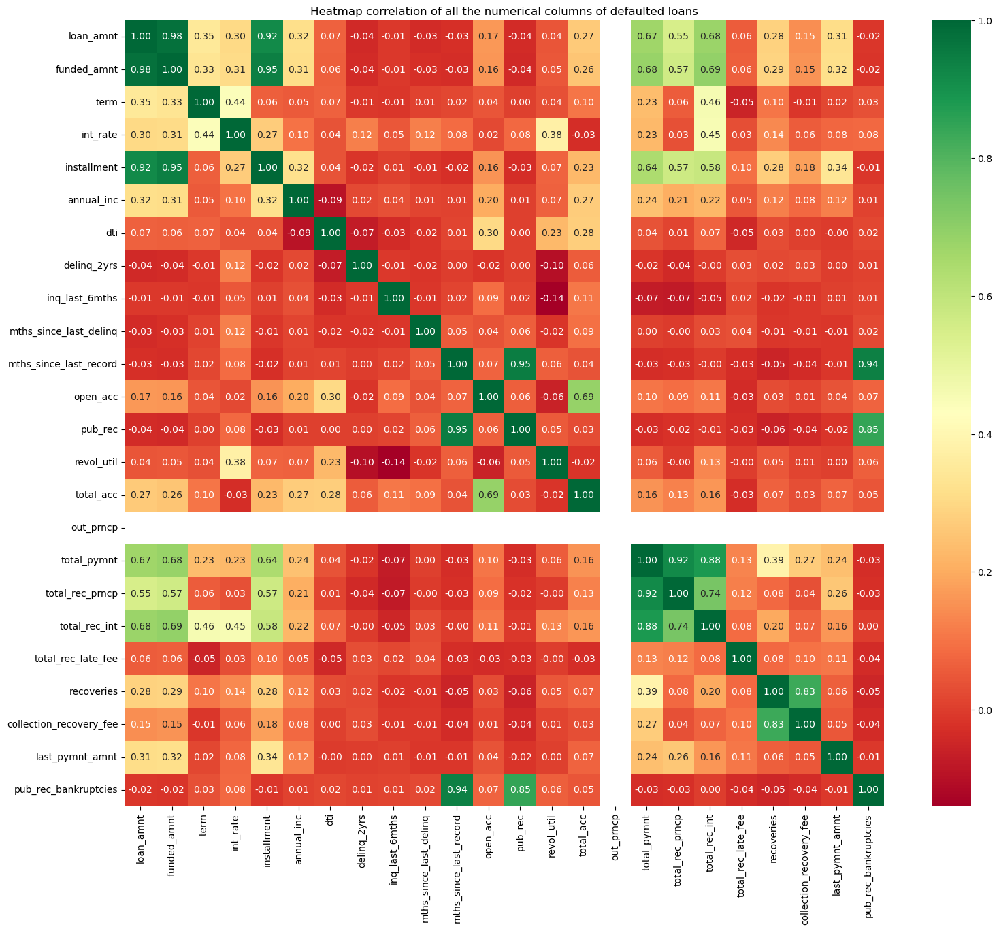

In [428]:
plt.figure(figsize=(18,15)) 
plt.title("Heatmap correlation of all the numerical columns of defaulted loans", fontsize=12)
sns.heatmap(df_defaulted.select_dtypes(include='number').corr(),annot=True,fmt='.2f',cmap="RdYlGn") #include only columns having numeric values of defualted loans
plt.show()
